In [548]:
import numpy as np
import pandas as pd
from sklearn.linear_model import LinearRegression
from matplotlib import pyplot as plt

from tqdm import tqdm

import warnings
warnings.simplefilter('ignore')

%matplotlib inline
import matplotlib.image as img
%matplotlib inline
import matplotlib.image as img


import seaborn as sns
%config InlineBackend.figure_format = 'svg' 
from pylab import rcParams

from sklearn.metrics import r2_score as r2, mean_absolute_error as mae, mean_squared_error as mse
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from scipy.spatial.distance import cdist
from mpl_toolkits.mplot3d.axes3d import Axes3D
from sklearn.preprocessing import StandardScaler
from sklearn.manifold import TSNE
from sklearn.preprocessing import MinMaxScaler
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

In [549]:
def LinRegres_ReplaceNA (df_set_train, df_set_topredict, paramtoreplace, paramsarray):
    #df_set_train=dataframe.loc[dataframe[paramtoreplace].isnull()==False] 
    #df_set_topredict=dataframe.loc[dataframe[paramtoreplace].isnull()].copy()
    X_train = df_set_train[paramsarray]
    Y_train = df_set_train[paramtoreplace]
    X_topredict = df_set_topredict[paramsarray]
    lr = LinearRegression()
    lr.fit(X_train, Y_train)
    df_set_topredict[paramtoreplace] =  (lr.predict(X_topredict))
    df_train_changed = pd.concat([df_set_topredict, df_set_train], ignore_index=True)
    return df_train_changed
    
    

In [550]:
def display_components_in_2D_space(components_df, labels=None):
    """
    Функция для визуализации работы алгоритма понижения размерности в 2-D пространство
    """
    components_with_labels_df = pd.concat([components_df, labels], axis=1)

    if labels is not None:
        components_with_labels_df.plot(kind='scatter', x='component_1', y='component_2', 
                                         c=labels.name, cmap=plt.get_cmap('jet'),
                                         alpha=0.5, figsize=(15,10))
    else:
        components_with_labels_df.plot(kind='scatter', x='component_1', y='component_2', alpha=0.5, figsize=(15,10))

    plt.xlabel('component_1')
    plt.ylabel('component_2')
    plt.title('2D mapping of objects')    
    plt.show()


In [551]:
def reduce_dims_with_TSNE(df, n):
    """
    Функция для понижения размерности исходных данных методом tSNE
    n - число компонент (доступные значения: 2, 3)
    """
    tsne = TSNE(n_components=n, learning_rate=250, random_state=42)
    components = tsne.fit_transform(df)
    if n==2:
        reduced_df = pd.DataFrame(data = components, columns = ['component_1', 'component_2'])
    elif n==3:
        reduced_df = pd.DataFrame(data = components, columns = ['component_1', 'component_2', 'component_3'])
    else:
        print('Число компонент больше 3 в данной функции не поддержиается')
    return reduced_df

In [552]:
def display_components_in_3D_space(components_df, labels=None):
    """
    Функция для визуализации работы алгоритма понижения размерности в 3-D пространство
    """
    components_with_labels_df = pd.concat([components_df, labels], axis=1)

    fig = plt.figure(figsize=(15,10))
    ax = fig.add_subplot(111, projection='3d')
    
    if labels is not None:
        ax.scatter(components_with_labels_df['component_1'], 
                   components_with_labels_df['component_2'], 
                   components_with_labels_df['component_3'], 
                   c=labels, cmap=plt.get_cmap('jet'), alpha=0.5)
    else:
        ax.scatter(components_with_labels_df['component_1'], 
                   components_with_labels_df['component_2'], 
                   components_with_labels_df['component_3'], 
                   alpha=0.5)

    ax.set_xlabel('component_1')
    ax.set_ylabel('component_2')
    ax.set_zlabel('component_3')
    plt.title('3D mapping of objects')
    plt.show()

In [553]:
def apply_elbow_method(X):
    """
    Функция для оценки оптимального кол-ва кластеров методом локтя
    """
    distortions = []
    K = range(2,15)
    for k in K:
        kmeanModel = KMeans(n_clusters=k, random_state=33).fit(X)
        distortions.append(sum(np.min(cdist(X, kmeanModel.cluster_centers_, 'euclidean'), axis=1)) / X.shape[0])

    plt.figure(figsize=(10, 8))
    plt.plot(K, distortions, 'bx-')
    plt.xlabel('k')
    plt.ylabel('Distortion')
    plt.title('The Elbow Method showing the optimal k')
    plt.show()

In [554]:
def evaluate_preds(true_values, pred_values):
    """
    Функция для оценки и визуализции работы регрессионной модели
    """
    print("R2:\t" + str(round(r2(true_values, pred_values), 3)) + "\n" +
          "MAE:\t" + str(round(mae(true_values, pred_values), 3)) + "\n" +
          "MSE:\t" + str(round(mse(true_values, pred_values), 3)))
    
    plt.figure(figsize=(10,10)) 
    
    sns.scatterplot(x=pred_values, y=true_values)
    
    plt.xlabel('Predicted values')
    plt.ylabel('True values')
    plt.title('True vs Predicted values')
    plt.show()

In [555]:
def display_clusters_distribution(unique_labels, labels_counts):
    """
    Функция для визуализации распределения объектов по кластерам
    """
    plt.figure(figsize=(8,5))
    plt.bar(unique, counts)
    plt.xlabel('Clгsters')
    plt.xticks(unique)
    plt.ylabel('Count')
    plt.title('Clusters distribution')
    plt.show()

In [556]:
def reduce_dims_with_PCA(df, n):
    """
    Функция для понижения размерности исходных данных методом PCA
    n - число компонент (доступные значения: 2, 3)
    """
    pca = PCA(n_components=n)
    components = pca.fit_transform(df)
    if n==2:
        reduced_df = pd.DataFrame(data = components, columns = ['component_1', 'component_2'])
    elif n==3:
        reduced_df = pd.DataFrame(data = components, columns = ['component_1', 'component_2', 'component_3'])
    else:
        print('Число компонент больше 3 в данной функции не поддержиается')
    return reduced_df

In [653]:
DATASET_PATH = 'input/train.csv'
PREPARED_DATASET_PATH = 'output/train_prepared.csv'
DATASET_TEST_PATH = 'input/test.csv'
TRAIN_DATASET_EXT_PATH='output/train_ext.csv'
MODEL_FILE_PATH = 'model.pkl' 
TEST_DATASET_EXT_PATH = 'output/train_ext.csv'
RESULT_PATH='output/Alexander_zhdankin_result.csv'

In [558]:
df = pd.read_csv(DATASET_PATH)
#df_test = pd.read_csv(DATASET_TEST_PATH)

### Удаляем пропуски в LifeSquare, аномалии в Square<0, прогнозируем новые значения LifeSquare

In [561]:
df.loc[df['Square']<10, 'LifeSquare'] = None
df.loc[(df['LifeSquare']>df['Square'])|(df['LifeSquare']>1000)|(df['LifeSquare']<9),'LifeSquare'] = None
df.loc[df['Square']<10, 'Square'] = df['Square']*10


In [562]:
df_set_topredict=df.loc[df['LifeSquare'].isnull()].copy()
df_set_train=df.loc[(df['LifeSquare'].isnull()==False)] 
df_changed = LinRegres_ReplaceNA (df_set_train, df_set_topredict, 'LifeSquare',["Rooms", "Square","KitchenSquare" ] )

In [563]:
df_changed.drop("Healthcare_1", axis=1, inplace=True)

In [564]:
df_changed_new = df_changed.copy()
df_changed.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 19 columns):
Id               10000 non-null int64
DistrictId       10000 non-null int64
Rooms            10000 non-null float64
Square           10000 non-null float64
LifeSquare       10000 non-null float64
KitchenSquare    10000 non-null float64
Floor            10000 non-null int64
HouseFloor       10000 non-null float64
HouseYear        10000 non-null int64
Ecology_1        10000 non-null float64
Ecology_2        10000 non-null object
Ecology_3        10000 non-null object
Social_1         10000 non-null int64
Social_2         10000 non-null int64
Social_3         10000 non-null int64
Helthcare_2      10000 non-null int64
Shops_1          10000 non-null int64
Shops_2          10000 non-null object
Price            10000 non-null float64
dtypes: float64(7), int64(9), object(3)
memory usage: 1.4+ MB


In [565]:
y = pd.DataFrame(df_changed[["Id",'Square',"Price"]], columns=["Id",'Square',"Price"])
df_features = df_changed.drop('Price', axis=1)
y["meter_price"] = y["Price"]/y['Square']

In [566]:
y.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 4 columns):
Id             10000 non-null int64
Square         10000 non-null float64
Price          10000 non-null float64
meter_price    10000 non-null float64
dtypes: float64(3), int64(1)
memory usage: 312.6 KB


## Обрабатываем неколичественные признаки

In [567]:
df_features=pd.get_dummies(df_features)


In [505]:
df_features.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 21 columns):
Id               10000 non-null int64
DistrictId       10000 non-null int64
Rooms            10000 non-null float64
Square           10000 non-null float64
LifeSquare       10000 non-null float64
KitchenSquare    10000 non-null float64
Floor            10000 non-null int64
HouseFloor       10000 non-null float64
HouseYear        10000 non-null int64
Ecology_1        10000 non-null float64
Social_1         10000 non-null int64
Social_2         10000 non-null int64
Social_3         10000 non-null int64
Helthcare_2      10000 non-null int64
Shops_1          10000 non-null int64
Ecology_2_A      10000 non-null uint8
Ecology_2_B      10000 non-null uint8
Ecology_3_A      10000 non-null uint8
Ecology_3_B      10000 non-null uint8
Shops_2_A        10000 non-null uint8
Shops_2_B        10000 non-null uint8
dtypes: float64(6), int64(9), uint8(6)
memory usage: 1.2 MB


In [569]:
df_features.head()

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,...,Social_2,Social_3,Helthcare_2,Shops_1,Ecology_2_A,Ecology_2_B,Ecology_3_A,Ecology_3_B,Shops_2_A,Shops_2_B
0,11993,74,2.0,80.312926,55.093282,0.0,14,0.0,1977,0.075779,...,1437,3,0,2,0,1,0,1,0,1
1,5172,1,2.0,64.511437,42.880374,1.0,9,17.0,1977,0.007122,...,264,0,0,1,0,1,0,1,0,1
2,11935,27,2.0,64.711835,43.035162,1.0,15,1.0,1977,0.211401,...,1892,0,0,1,0,1,0,1,0,1
3,6641,54,3.0,118.907612,84.323281,0.0,2,0.0,1977,0.006076,...,5285,0,6,6,0,1,0,1,0,1
4,5073,74,2.0,82.667915,56.904455,1.0,16,17.0,1977,0.075779,...,1437,3,0,2,0,1,0,1,0,1


### Уменьшение количества признаков и кластеризация

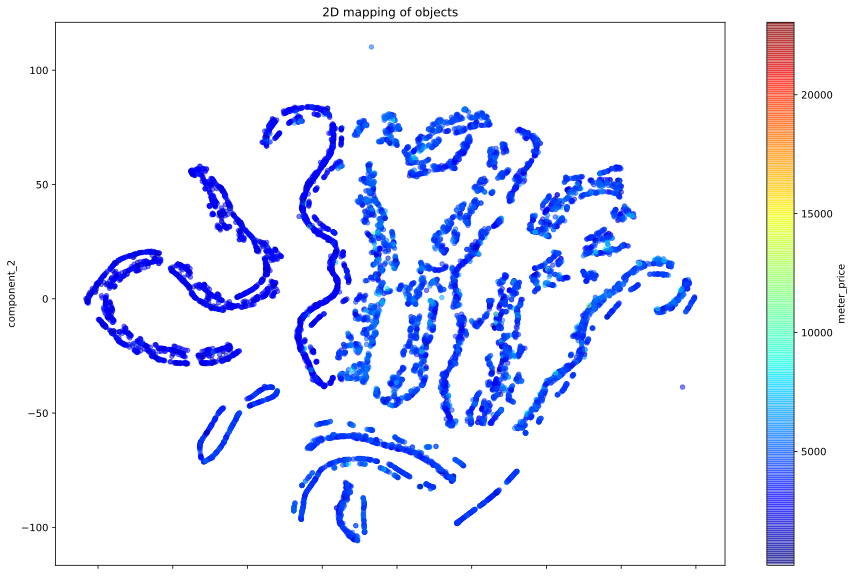

In [570]:
X=df_features
X_2D_tsne = reduce_dims_with_TSNE (X, 2)
display_components_in_2D_space(X_2D_tsne, y['Price'])



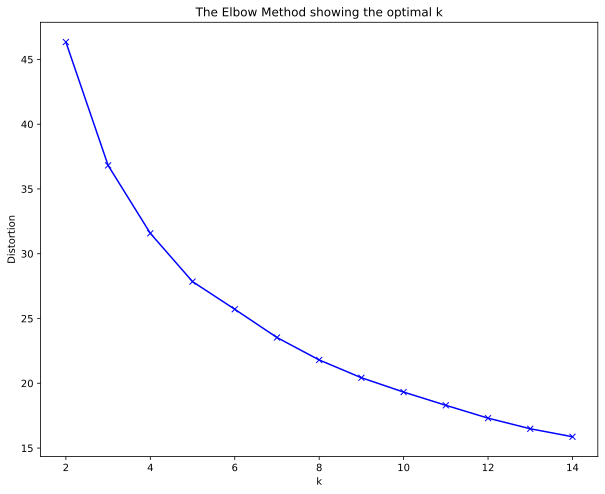

In [571]:
apply_elbow_method (X_2D_tsne)

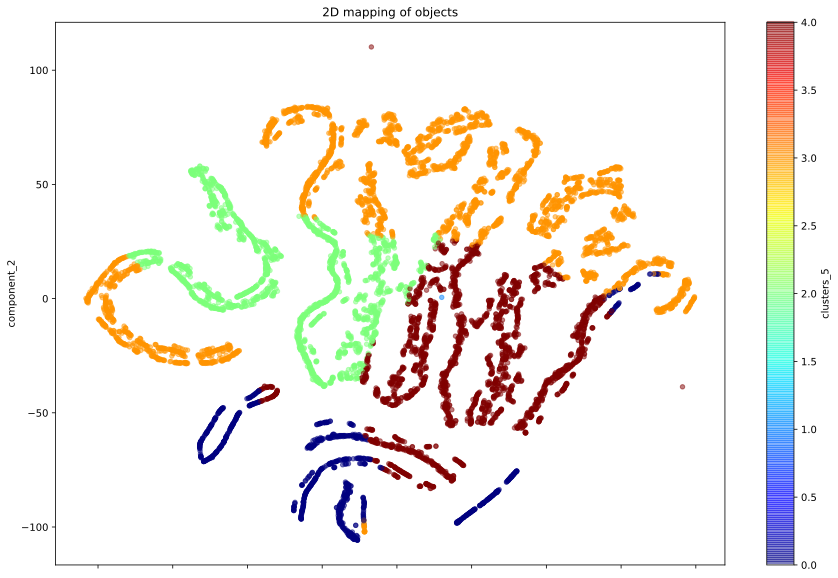

In [572]:
kmeans_5 = KMeans(n_clusters=5, random_state=33)
labels_clast_5 = kmeans_5.fit_predict(X)
labels_clast_5 = pd.Series(labels_clast_5, name='clusters_5')
display_components_in_2D_space(X_2D_tsne, labels_clast_5)

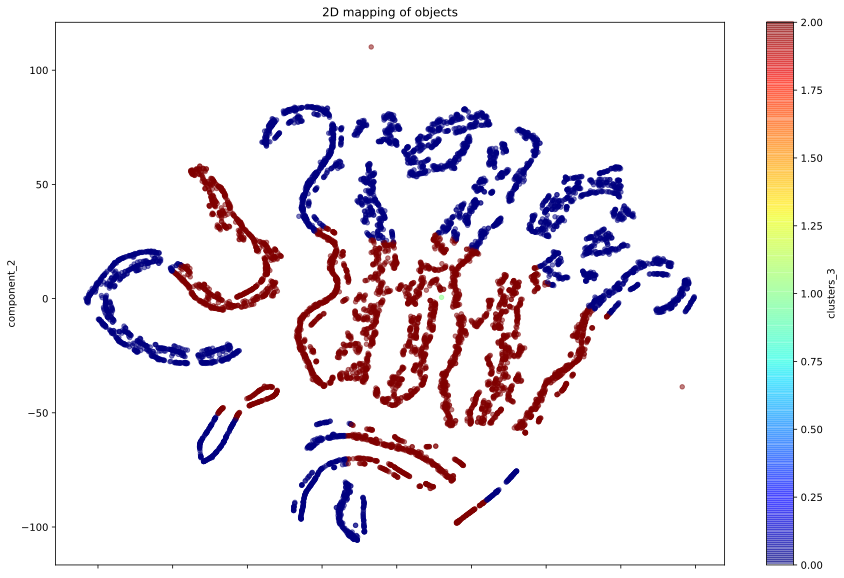

In [573]:
kmeans_3 = KMeans(n_clusters=3, random_state=33)
labels_clast_3 = kmeans_3.fit_predict(X)
labels_clast_3 = pd.Series(labels_clast_3, name='clusters_3')
display_components_in_2D_space(X_2D_tsne, labels_clast_3)

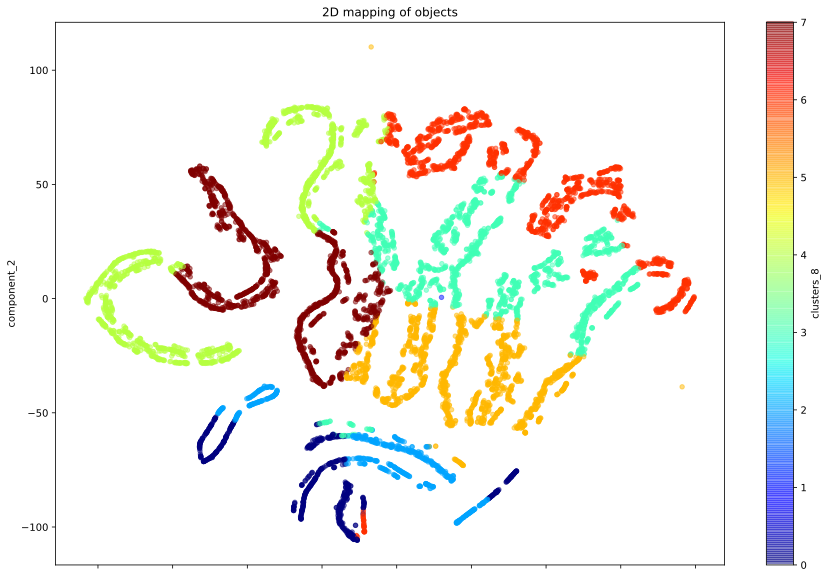

In [576]:
kmeans_8 = KMeans(n_clusters=8, random_state=33)
labels_clast_8 = kmeans_8.fit_predict(X)
labels_clast_8 = pd.Series(labels_clast_8, name='clusters_8')
display_components_in_2D_space(X_2D_tsne, labels_clast_8)

## Добавляем новые признаки в датасет

In [577]:
clusters_3_dummies = pd.get_dummies(labels_clast_3, drop_first=True, prefix='clusters_3')
clusters_5_dummies = pd.get_dummies(labels_clast_5, drop_first=True, prefix='clusters_5')
clusters_8_dummies = pd.get_dummies(labels_clast_8, drop_first=True, prefix='clusters_8')

In [578]:
df_ext = pd.concat([df_features, X_2D_tsne, clusters_3_dummies, clusters_5_dummies,clusters_8_dummies,
                    y['Price'], y['meter_price']], 
                   axis=1)



df_ext.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 38 columns):
Id               10000 non-null int64
DistrictId       10000 non-null int64
Rooms            10000 non-null float64
Square           10000 non-null float64
LifeSquare       10000 non-null float64
KitchenSquare    10000 non-null float64
Floor            10000 non-null int64
HouseFloor       10000 non-null float64
HouseYear        10000 non-null int64
Ecology_1        10000 non-null float64
Social_1         10000 non-null int64
Social_2         10000 non-null int64
Social_3         10000 non-null int64
Helthcare_2      10000 non-null int64
Shops_1          10000 non-null int64
Ecology_2_A      10000 non-null uint8
Ecology_2_B      10000 non-null uint8
Ecology_3_A      10000 non-null uint8
Ecology_3_B      10000 non-null uint8
Shops_2_A        10000 non-null uint8
Shops_2_B        10000 non-null uint8
component_1      10000 non-null float32
component_2      10000 non-null float32
cl

## Сохранение расширенного обучающего датасета

In [580]:
df_ext.to_csv(TRAIN_DATASET_EXT_PATH, index=False, encoding='utf-8')

## Делим расширенный датасет на train и test

In [581]:
df_ext = pd.read_csv(TRAIN_DATASET_EXT_PATH,  encoding='utf-8')

In [582]:
df_ext.head()

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,...,clusters_5_4,clusters_8_1,clusters_8_2,clusters_8_3,clusters_8_4,clusters_8_5,clusters_8_6,clusters_8_7,Price,meter_price
0,11993,74,2.0,80.312926,55.093282,0.0,14,0.0,1977,0.075779,...,0,0,0,0,0,0,0,1,221244.156664,2754.776456
1,5172,1,2.0,64.511437,42.880374,1.0,9,17.0,1977,0.007122,...,0,0,0,0,1,0,0,0,229102.795999,3551.351598
2,11935,27,2.0,64.711835,43.035162,1.0,15,1.0,1977,0.211401,...,0,0,0,0,0,0,0,1,127200.026511,1965.637764
3,6641,54,3.0,118.907612,84.323281,0.0,2,0.0,1977,0.006076,...,0,0,0,1,0,0,0,0,571069.052600,4802.628223
4,5073,74,2.0,82.667915,56.904455,1.0,16,17.0,1977,0.075779,...,0,0,0,0,1,0,0,0,244145.827069,2953.332352


In [583]:
X = df_ext.iloc[:, :-2]
y = df_ext[['Id','Square', 'Price', 'meter_price']]

In [586]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, shuffle=True, random_state=21)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6700 entries, 9239 to 5327
Data columns (total 36 columns):
Id               6700 non-null int64
DistrictId       6700 non-null int64
Rooms            6700 non-null float64
Square           6700 non-null float64
LifeSquare       6700 non-null float64
KitchenSquare    6700 non-null float64
Floor            6700 non-null int64
HouseFloor       6700 non-null float64
HouseYear        6700 non-null int64
Ecology_1        6700 non-null float64
Social_1         6700 non-null int64
Social_2         6700 non-null int64
Social_3         6700 non-null int64
Helthcare_2      6700 non-null int64
Shops_1          6700 non-null int64
Ecology_2_A      6700 non-null int64
Ecology_2_B      6700 non-null int64
Ecology_3_A      6700 non-null int64
Ecology_3_B      6700 non-null int64
Shops_2_A        6700 non-null int64
Shops_2_B        6700 non-null int64
component_1      6700 non-null float64
component_2      6700 non-null float64
clusters_3_1     6700 n

## Обучение финальной модели

## Модель с применением ForestRegression

In [596]:
final_model_Forest=RandomForestRegressor(n_estimators=100, max_depth=12,random_state=42)




In [597]:
final_model_Forest.fit(X_train, y_train['Price'])

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=12,
                      max_features='auto', max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, n_estimators=100,
                      n_jobs=None, oob_score=False, random_state=42, verbose=0,
                      warm_start=False)

R2:	0.905
MAE:	18809.13
MSE:	806659568.639


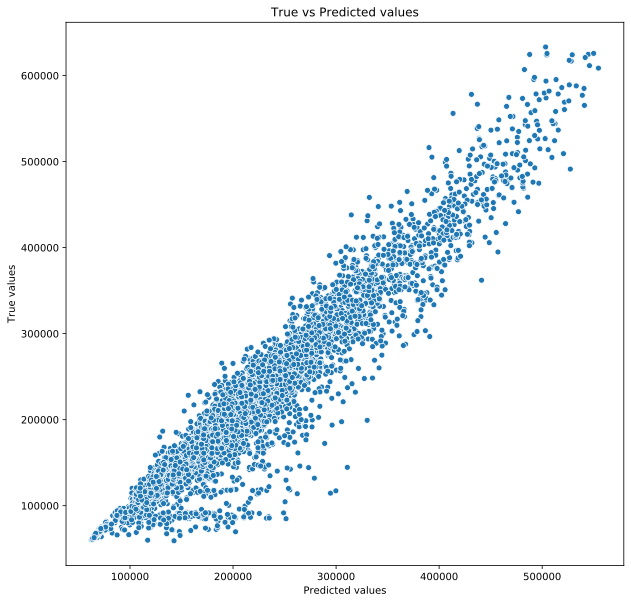

In [598]:
y_train_preds = final_model_Forest.predict(X_train)
evaluate_preds(y_train['Price'], y_train_preds)

R2:	0.723
MAE:	29679.444
MSE:	2457923638.643


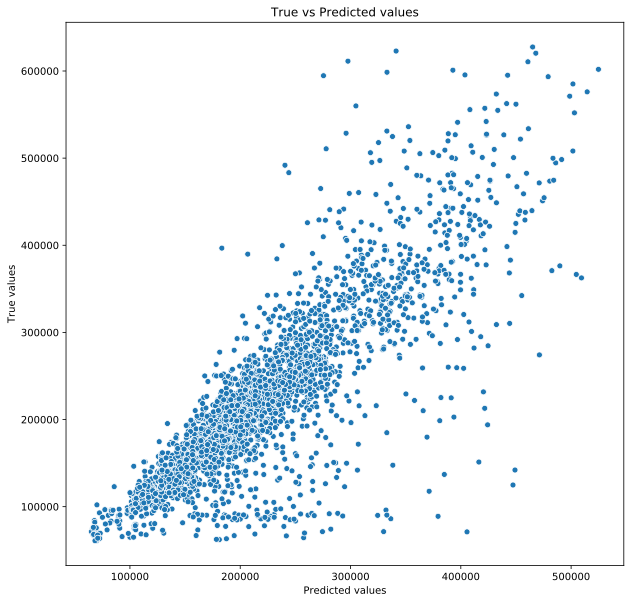

In [599]:
y_test_preds = final_model_Forest.predict(X_test)
evaluate_preds(y_test['Price'], y_test_preds)

In [606]:
import pickle

#сохраняем модель на будущее
pickle.dump(final_model_Forest, open(MODEL_FILE_PATH, 'wb'))

### Загрузка и обработка тестовых данных

In [611]:
df = pd.read_csv(DATASET_TEST_PATH)


In [612]:
with open(MODEL_FILE_PATH, 'rb') as f:
    my_model = pickle.load(f)

In [613]:
# обрабатываем тестовые данные на предмет пропусков и нечисловых данных
df.loc[df['Square']<10, 'LifeSquare'] = None
df.loc[(df['LifeSquare']>df['Square'])|(df['LifeSquare']>1000)|(df['LifeSquare']<9),'LifeSquare'] = None
df.loc[df['Square']<10, 'Square'] = df['Square']*10

In [614]:
df_set_topredict=df.loc[df['LifeSquare'].isnull()].copy()
df_set_train=df.loc[(df['LifeSquare'].isnull()==False)] 
df_changed = LinRegres_ReplaceNA (df_set_train, df_set_topredict, 'LifeSquare',["Rooms", "Square","KitchenSquare" ] )

In [615]:
df_changed.drop("Healthcare_1", axis=1, inplace=True)

In [616]:
df_changed_new = df_changed.copy()
df_changed.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 18 columns):
Id               5000 non-null int64
DistrictId       5000 non-null int64
Rooms            5000 non-null float64
Square           5000 non-null float64
LifeSquare       5000 non-null float64
KitchenSquare    5000 non-null float64
Floor            5000 non-null int64
HouseFloor       5000 non-null float64
HouseYear        5000 non-null int64
Ecology_1        5000 non-null float64
Ecology_2        5000 non-null object
Ecology_3        5000 non-null object
Social_1         5000 non-null int64
Social_2         5000 non-null int64
Social_3         5000 non-null int64
Helthcare_2      5000 non-null int64
Shops_1          5000 non-null int64
Shops_2          5000 non-null object
dtypes: float64(6), int64(9), object(3)
memory usage: 703.2+ KB


In [626]:
df_features=df_changed_new
df_features=pd.get_dummies(df_features)
df_features.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 21 columns):
Id               5000 non-null int64
DistrictId       5000 non-null int64
Rooms            5000 non-null float64
Square           5000 non-null float64
LifeSquare       5000 non-null float64
KitchenSquare    5000 non-null float64
Floor            5000 non-null int64
HouseFloor       5000 non-null float64
HouseYear        5000 non-null int64
Ecology_1        5000 non-null float64
Social_1         5000 non-null int64
Social_2         5000 non-null int64
Social_3         5000 non-null int64
Helthcare_2      5000 non-null int64
Shops_1          5000 non-null int64
Ecology_2_A      5000 non-null uint8
Ecology_2_B      5000 non-null uint8
Ecology_3_A      5000 non-null uint8
Ecology_3_B      5000 non-null uint8
Shops_2_A        5000 non-null uint8
Shops_2_B        5000 non-null uint8
dtypes: float64(6), int64(9), uint8(6)
memory usage: 615.4 KB


In [627]:
X=df_features
X_2D_tsne = reduce_dims_with_TSNE (X, 2)

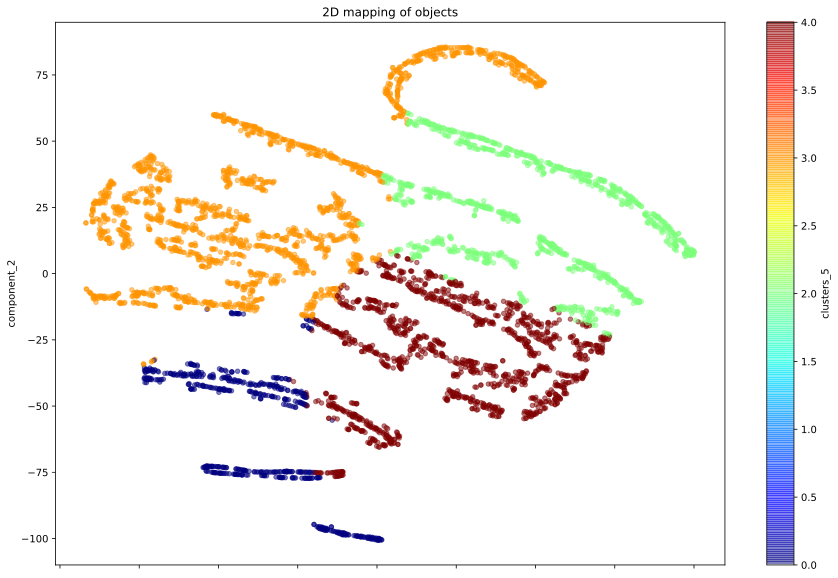

In [629]:
labels_clast_5 = kmeans_5.predict(X)
labels_clast_5 = pd.Series(labels_clast_5, name='clusters_5')
display_components_in_2D_space(X_2D_tsne, labels_clast_5) 

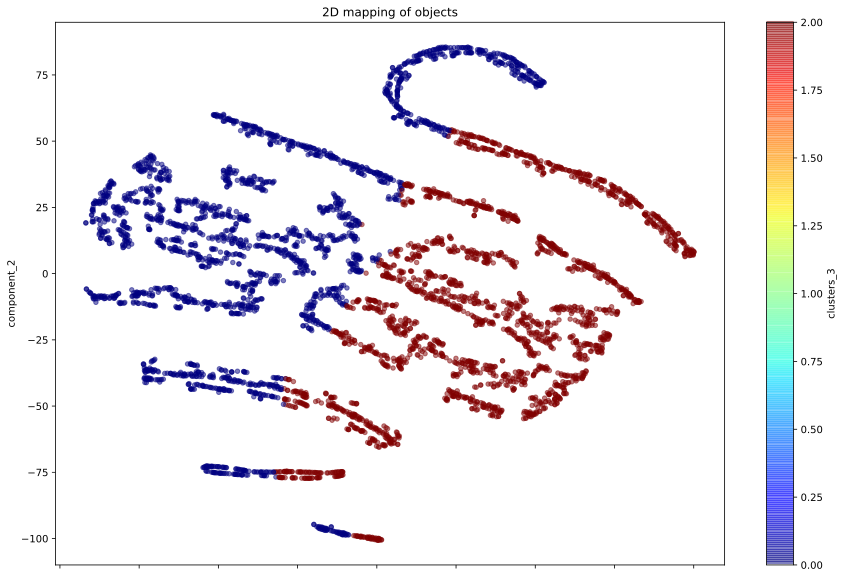

In [630]:
labels_clast_3 = kmeans_3.predict(X)
labels_clast_3 = pd.Series(labels_clast_3, name='clusters_3')
display_components_in_2D_space(X_2D_tsne, labels_clast_3)

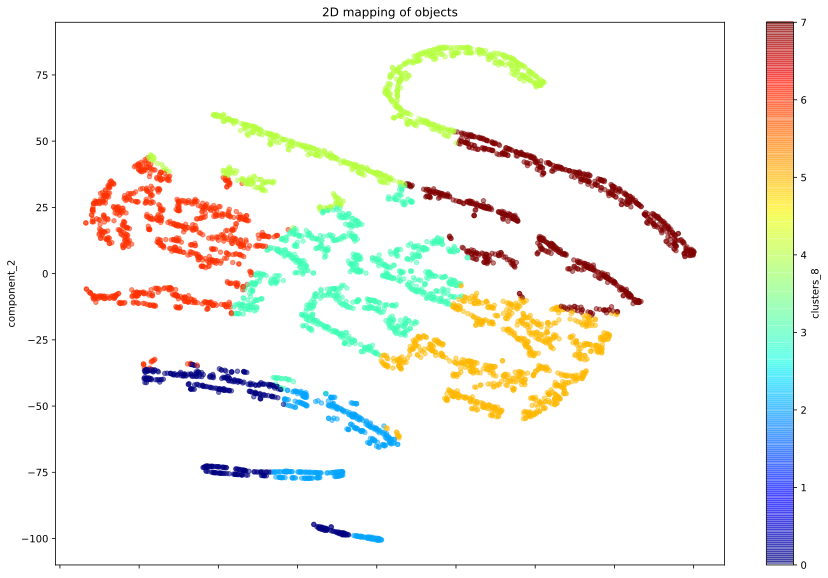

In [631]:
labels_clast_8 = kmeans_8.predict(X)
labels_clast_8 = pd.Series(labels_clast_8, name='clusters_8')
display_components_in_2D_space(X_2D_tsne, labels_clast_8)


### Дополняем тестовый датасет

In [646]:
clusters_3_dummies = pd.get_dummies(labels_clast_3,  prefix='clusters_3')
clusters_5_dummies = pd.get_dummies(labels_clast_5,  prefix='clusters_5')
clusters_8_dummies = pd.get_dummies(labels_clast_8,  prefix='clusters_8')


In [647]:
df_ext_test = pd.concat([df_features, X_2D_tsne, clusters_3_dummies, clusters_5_dummies,clusters_8_dummies]
                    , 
                   axis=1)



df_ext_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 36 columns):
Id               5000 non-null int64
DistrictId       5000 non-null int64
Rooms            5000 non-null float64
Square           5000 non-null float64
LifeSquare       5000 non-null float64
KitchenSquare    5000 non-null float64
Floor            5000 non-null int64
HouseFloor       5000 non-null float64
HouseYear        5000 non-null int64
Ecology_1        5000 non-null float64
Social_1         5000 non-null int64
Social_2         5000 non-null int64
Social_3         5000 non-null int64
Helthcare_2      5000 non-null int64
Shops_1          5000 non-null int64
Ecology_2_A      5000 non-null uint8
Ecology_2_B      5000 non-null uint8
Ecology_3_A      5000 non-null uint8
Ecology_3_B      5000 non-null uint8
Shops_2_A        5000 non-null uint8
Shops_2_B        5000 non-null uint8
component_1      5000 non-null float32
component_2      5000 non-null float32
clusters_3_0     5000 non-

In [648]:

df_ext_test.to_csv(TEST_DATASET_EXT_PATH, index=False, encoding='utf-8')

### Предсказываем Price, используя сохраненную модель

In [649]:
df_ext_test = pd.read_csv(TEST_DATASET_EXT_PATH,  encoding='utf-8')

In [650]:
price_predicted = my_model.predict(df_ext_test)

In [652]:
result= pd.DataFrame({
    "ID": df_ext_test["Id"],
    "price_predicted": price_predicted.flatten(),
})

result.head(10)

,ID,price_predicted
0,15856,220812.678959
1,5480,190010.849580
2,7633,215236.008825
3,3310,218113.276166
4,5214,107011.624214
5,3495,213359.095643
6,16688,150489.758891
7,8968,173114.243287
8,11160,116922.152346
9,2982,179582.990507


In [654]:
result.to_csv(RESULT_PATH, index=False, encoding='utf-8')
